# This is an excellent repo to a TCN implementation for tensorflow: https://github.com/philipperemy/keras-tcn

# Check the Python version being used

In [1]:
!python --version

Python 3.7.6


# Check that the available gpu is being utilized

In [2]:
import tensorflow as tf

In [3]:
print("Num GPUs Available")
print(len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available
1


# Start of second method of time series forecasting (cnn) without any normalization and with minimum bridge data

In [4]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [5]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [6]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [7]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [8]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [9]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [10]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [11]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [12]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [13]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [14]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Build tcn model

In [15]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Input, Model

from tcn import TCN, tcn_full_summary

batch_size, timesteps, input_dim = None, 21, 6

i = Input(batch_shape=(batch_size, timesteps, input_dim))

o = TCN(return_sequences=False)(i)
o = Dense(1)(o)

tcn_model = Model(inputs=[i], outputs=[o])
tcn_model.compile(optimizer='adam', loss='mae')

tcn_full_summary(tcn_model, expand_residual_blocks=False)

history = tcn_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 21, 6)]           0         
_________________________________________________________________
residual_block_0 (ResidualBl [(None, 21, 64), (None, 2 9536      
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_3 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_4 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_5 (ResidualBl [(None, 21, 64), (None, 2

Epoch 105/2000
10/10 - 0s - loss: 358.9563 - val_loss: 738.6483
Epoch 106/2000
10/10 - 0s - loss: 309.0988 - val_loss: 505.5214
Epoch 107/2000
10/10 - 0s - loss: 293.8194 - val_loss: 656.7958
Epoch 108/2000
10/10 - 0s - loss: 232.8639 - val_loss: 434.2420
Epoch 109/2000
10/10 - 0s - loss: 249.9293 - val_loss: 767.8323
Epoch 110/2000
10/10 - 0s - loss: 291.4716 - val_loss: 543.2147
Epoch 111/2000
10/10 - 0s - loss: 255.3657 - val_loss: 574.2487
Epoch 112/2000
10/10 - 0s - loss: 280.7947 - val_loss: 606.6094
Epoch 113/2000
10/10 - 0s - loss: 317.8814 - val_loss: 881.6838
Epoch 114/2000
10/10 - 0s - loss: 191.4767 - val_loss: 637.3795
Epoch 115/2000
10/10 - 0s - loss: 185.9961 - val_loss: 281.6841
Epoch 116/2000
10/10 - 0s - loss: 274.4398 - val_loss: 462.1351
Epoch 117/2000
10/10 - 0s - loss: 217.5948 - val_loss: 717.5918
Epoch 118/2000
10/10 - 0s - loss: 396.0923 - val_loss: 452.6674
Epoch 119/2000
10/10 - 0s - loss: 237.0798 - val_loss: 544.3823
Epoch 120/2000
10/10 - 0s - loss: 239.40

10/10 - 0s - loss: 176.0298 - val_loss: 227.3283
Epoch 234/2000
10/10 - 0s - loss: 125.6576 - val_loss: 279.3817
Epoch 235/2000
10/10 - 0s - loss: 198.9834 - val_loss: 211.0762
Epoch 236/2000
10/10 - 0s - loss: 133.0982 - val_loss: 223.8115
Epoch 237/2000
10/10 - 0s - loss: 127.6800 - val_loss: 515.4937
Epoch 238/2000
10/10 - 0s - loss: 231.8131 - val_loss: 394.1836
Epoch 239/2000
10/10 - 0s - loss: 201.5903 - val_loss: 396.7509
Epoch 240/2000
10/10 - 0s - loss: 178.8260 - val_loss: 1014.5749
Epoch 241/2000
10/10 - 0s - loss: 185.9669 - val_loss: 399.3017
Epoch 242/2000
10/10 - 0s - loss: 156.4543 - val_loss: 302.3180
Epoch 243/2000
10/10 - 0s - loss: 117.4275 - val_loss: 408.0414
Epoch 244/2000
10/10 - 0s - loss: 158.4901 - val_loss: 551.8183
Epoch 245/2000
10/10 - 0s - loss: 279.6863 - val_loss: 256.0173
Epoch 246/2000
10/10 - 0s - loss: 146.1804 - val_loss: 263.3587
Epoch 247/2000
10/10 - 0s - loss: 159.9802 - val_loss: 645.3808
Epoch 248/2000
10/10 - 0s - loss: 255.2838 - val_loss:

Epoch 362/2000
10/10 - 0s - loss: 172.9859 - val_loss: 179.6310
Epoch 363/2000
10/10 - 0s - loss: 112.3494 - val_loss: 139.8705
Epoch 364/2000
10/10 - 0s - loss: 98.3759 - val_loss: 292.9486
Epoch 365/2000
10/10 - 0s - loss: 150.9069 - val_loss: 143.4560
Epoch 366/2000
10/10 - 0s - loss: 102.4704 - val_loss: 267.0840
Epoch 367/2000
10/10 - 0s - loss: 96.5446 - val_loss: 304.4113
Epoch 368/2000
10/10 - 0s - loss: 151.9139 - val_loss: 161.3192
Epoch 369/2000
10/10 - 0s - loss: 93.8960 - val_loss: 199.2376
Epoch 370/2000
10/10 - 0s - loss: 91.3389 - val_loss: 301.1936
Epoch 371/2000
10/10 - 0s - loss: 120.6141 - val_loss: 167.8248
Epoch 372/2000
10/10 - 0s - loss: 100.9685 - val_loss: 420.2926
Epoch 373/2000
10/10 - 0s - loss: 191.7463 - val_loss: 605.8313
Epoch 374/2000
10/10 - 0s - loss: 109.6112 - val_loss: 253.2229
Epoch 375/2000
10/10 - 0s - loss: 157.1786 - val_loss: 186.2376
Epoch 376/2000
10/10 - 0s - loss: 95.3360 - val_loss: 370.7911
Epoch 377/2000
10/10 - 0s - loss: 179.0928 - 

10/10 - 0s - loss: 118.9006 - val_loss: 116.1534
Epoch 492/2000
10/10 - 0s - loss: 94.5112 - val_loss: 260.4150
Epoch 493/2000
10/10 - 0s - loss: 84.2027 - val_loss: 228.6913
Epoch 494/2000
10/10 - 0s - loss: 80.1619 - val_loss: 94.1676
Epoch 495/2000
10/10 - 0s - loss: 84.6002 - val_loss: 241.8152
Epoch 496/2000
10/10 - 0s - loss: 52.0222 - val_loss: 276.6875
Epoch 497/2000
10/10 - 0s - loss: 111.4594 - val_loss: 134.3461
Epoch 498/2000
10/10 - 0s - loss: 53.1033 - val_loss: 289.3534
Epoch 499/2000
10/10 - 0s - loss: 125.3840 - val_loss: 132.9727
Epoch 500/2000
10/10 - 0s - loss: 59.1821 - val_loss: 154.1799
Epoch 501/2000
10/10 - 0s - loss: 87.0791 - val_loss: 130.5145
Epoch 502/2000
10/10 - 0s - loss: 76.3472 - val_loss: 134.1511
Epoch 503/2000
10/10 - 0s - loss: 108.6596 - val_loss: 124.8807
Epoch 504/2000
10/10 - 0s - loss: 76.2220 - val_loss: 90.7721
Epoch 505/2000
10/10 - 0s - loss: 63.0679 - val_loss: 226.8172
Epoch 506/2000
10/10 - 0s - loss: 110.4027 - val_loss: 274.2577
Epoc

Epoch 621/2000
10/10 - 0s - loss: 47.3182 - val_loss: 228.4278
Epoch 622/2000
10/10 - 0s - loss: 109.0394 - val_loss: 336.4344
Epoch 623/2000
10/10 - 0s - loss: 92.4880 - val_loss: 239.2436
Epoch 624/2000
10/10 - 0s - loss: 77.9536 - val_loss: 114.6255
Epoch 625/2000
10/10 - 0s - loss: 71.3000 - val_loss: 64.5251
Epoch 626/2000
10/10 - 0s - loss: 61.9353 - val_loss: 178.0353
Epoch 627/2000
10/10 - 0s - loss: 61.8073 - val_loss: 399.7172
Epoch 628/2000
10/10 - 0s - loss: 131.5062 - val_loss: 154.0000
Epoch 629/2000
10/10 - 0s - loss: 85.2043 - val_loss: 156.9458
Epoch 630/2000
10/10 - 0s - loss: 124.9078 - val_loss: 115.1609
Epoch 631/2000
10/10 - 0s - loss: 58.8079 - val_loss: 66.8878
Epoch 632/2000
10/10 - 0s - loss: 63.2669 - val_loss: 149.7012
Epoch 633/2000
10/10 - 0s - loss: 75.9149 - val_loss: 259.2472
Epoch 634/2000
10/10 - 0s - loss: 110.5569 - val_loss: 263.0963
Epoch 635/2000
10/10 - 0s - loss: 125.5321 - val_loss: 140.8839
Epoch 636/2000
10/10 - 0s - loss: 64.4153 - val_loss

Epoch 752/2000
10/10 - 0s - loss: 64.5000 - val_loss: 63.4705
Epoch 753/2000
10/10 - 0s - loss: 43.7965 - val_loss: 132.9806
Epoch 754/2000
10/10 - 0s - loss: 58.5292 - val_loss: 93.3335
Epoch 755/2000
10/10 - 0s - loss: 57.3331 - val_loss: 103.4521
Epoch 756/2000
10/10 - 0s - loss: 88.1085 - val_loss: 56.1394
Epoch 757/2000
10/10 - 0s - loss: 56.0364 - val_loss: 120.1059
Epoch 758/2000
10/10 - 0s - loss: 40.2994 - val_loss: 207.7303
Epoch 759/2000
10/10 - 0s - loss: 81.9689 - val_loss: 252.1319
Epoch 760/2000
10/10 - 0s - loss: 113.8914 - val_loss: 382.9674
Epoch 761/2000
10/10 - 0s - loss: 153.5495 - val_loss: 405.3104
Epoch 762/2000
10/10 - 0s - loss: 189.1840 - val_loss: 61.3078
Epoch 763/2000
10/10 - 0s - loss: 96.1803 - val_loss: 226.3291
Epoch 764/2000
10/10 - 0s - loss: 125.5963 - val_loss: 257.1988
Epoch 765/2000
10/10 - 0s - loss: 152.6510 - val_loss: 67.9743
Epoch 766/2000
10/10 - 0s - loss: 98.7952 - val_loss: 254.0591
Epoch 767/2000
10/10 - 0s - loss: 139.7940 - val_loss: 

Epoch 883/2000
10/10 - 0s - loss: 37.0420 - val_loss: 180.7447
Epoch 884/2000
10/10 - 0s - loss: 76.8562 - val_loss: 119.1172
Epoch 885/2000
10/10 - 0s - loss: 56.9843 - val_loss: 87.6529
Epoch 886/2000
10/10 - 0s - loss: 43.2936 - val_loss: 127.0315
Epoch 887/2000
10/10 - 0s - loss: 76.3292 - val_loss: 43.7597
Epoch 888/2000
10/10 - 0s - loss: 40.4081 - val_loss: 49.6980
Epoch 889/2000
10/10 - 0s - loss: 28.8779 - val_loss: 41.9253
Epoch 890/2000
10/10 - 0s - loss: 45.9934 - val_loss: 148.2361
Epoch 891/2000
10/10 - 0s - loss: 75.8933 - val_loss: 147.6761
Epoch 892/2000
10/10 - 0s - loss: 58.0557 - val_loss: 39.8368
Epoch 893/2000
10/10 - 0s - loss: 46.7781 - val_loss: 74.3075
Epoch 894/2000
10/10 - 0s - loss: 51.4375 - val_loss: 66.5635
Epoch 895/2000
10/10 - 0s - loss: 61.7422 - val_loss: 65.2895
Epoch 896/2000
10/10 - 0s - loss: 57.5251 - val_loss: 85.5985
Epoch 897/2000
10/10 - 0s - loss: 39.8465 - val_loss: 135.9556
Epoch 898/2000
10/10 - 0s - loss: 67.0997 - val_loss: 122.0599
E

10/10 - 0s - loss: 60.4164 - val_loss: 78.8715
Epoch 1015/2000
10/10 - 0s - loss: 45.3669 - val_loss: 97.6507
Epoch 1016/2000
10/10 - 0s - loss: 47.3066 - val_loss: 52.5455
Epoch 1017/2000
10/10 - 0s - loss: 43.7009 - val_loss: 169.5852
Epoch 1018/2000
10/10 - 0s - loss: 43.5148 - val_loss: 119.3387
Epoch 1019/2000
10/10 - 0s - loss: 75.9150 - val_loss: 34.1628
Epoch 1020/2000
10/10 - 0s - loss: 37.5054 - val_loss: 88.0132
Epoch 1021/2000
10/10 - 0s - loss: 64.6001 - val_loss: 54.1769
Epoch 1022/2000
10/10 - 0s - loss: 22.6785 - val_loss: 59.6091
Epoch 1023/2000
10/10 - 0s - loss: 48.3223 - val_loss: 57.3275
Epoch 1024/2000
10/10 - 0s - loss: 51.1347 - val_loss: 50.3141
Epoch 1025/2000
10/10 - 0s - loss: 39.6578 - val_loss: 44.7330
Epoch 1026/2000
10/10 - 0s - loss: 49.2133 - val_loss: 39.7434
Epoch 1027/2000
10/10 - 0s - loss: 43.2968 - val_loss: 73.7245
Epoch 1028/2000
10/10 - 0s - loss: 30.1128 - val_loss: 145.4579
Epoch 1029/2000
10/10 - 0s - loss: 65.2886 - val_loss: 45.4839
Epoch

Epoch 1144/2000
10/10 - 0s - loss: 30.3489 - val_loss: 35.0540
Epoch 1145/2000
10/10 - 0s - loss: 39.6045 - val_loss: 102.4897
Epoch 1146/2000
10/10 - 0s - loss: 55.3260 - val_loss: 99.4444
Epoch 1147/2000
10/10 - 0s - loss: 42.8099 - val_loss: 98.4721
Epoch 1148/2000
10/10 - 0s - loss: 32.8974 - val_loss: 50.8114
Epoch 1149/2000
10/10 - 0s - loss: 45.4375 - val_loss: 109.1909
Epoch 1150/2000
10/10 - 0s - loss: 35.7157 - val_loss: 43.9173
Epoch 1151/2000
10/10 - 0s - loss: 46.1673 - val_loss: 63.4958
Epoch 1152/2000
10/10 - 0s - loss: 39.7878 - val_loss: 56.5385
Epoch 1153/2000
10/10 - 0s - loss: 42.8182 - val_loss: 33.8819
Epoch 1154/2000
10/10 - 0s - loss: 47.0710 - val_loss: 95.4814
Epoch 1155/2000
10/10 - 0s - loss: 47.6150 - val_loss: 77.9361
Epoch 1156/2000
10/10 - 0s - loss: 33.4770 - val_loss: 65.6503
Epoch 1157/2000
10/10 - 0s - loss: 55.6249 - val_loss: 38.6245
Epoch 1158/2000
10/10 - 0s - loss: 35.1805 - val_loss: 35.2480
Epoch 1159/2000
10/10 - 0s - loss: 38.3467 - val_loss

Epoch 1274/2000
10/10 - 0s - loss: 30.2201 - val_loss: 42.9855
Epoch 1275/2000
10/10 - 0s - loss: 34.8702 - val_loss: 51.1267
Epoch 1276/2000
10/10 - 0s - loss: 42.3630 - val_loss: 84.7484
Epoch 1277/2000
10/10 - 0s - loss: 66.7988 - val_loss: 47.9998
Epoch 1278/2000
10/10 - 0s - loss: 30.5771 - val_loss: 31.6248
Epoch 1279/2000
10/10 - 0s - loss: 31.6173 - val_loss: 26.0013
Epoch 1280/2000
10/10 - 0s - loss: 33.9890 - val_loss: 90.3462
Epoch 1281/2000
10/10 - 0s - loss: 40.7351 - val_loss: 112.0191
Epoch 1282/2000
10/10 - 0s - loss: 64.5655 - val_loss: 53.3774
Epoch 1283/2000
10/10 - 0s - loss: 38.9768 - val_loss: 112.3801
Epoch 1284/2000
10/10 - 0s - loss: 29.4608 - val_loss: 84.6497
Epoch 1285/2000
10/10 - 0s - loss: 52.8181 - val_loss: 33.7606
Epoch 1286/2000
10/10 - 0s - loss: 40.7237 - val_loss: 113.3675
Epoch 1287/2000
10/10 - 0s - loss: 30.9817 - val_loss: 51.8597
Epoch 1288/2000
10/10 - 0s - loss: 47.7169 - val_loss: 26.8408
Epoch 1289/2000
10/10 - 0s - loss: 36.3937 - val_los

Epoch 1404/2000
10/10 - 0s - loss: 31.0531 - val_loss: 139.2654
Epoch 1405/2000
10/10 - 0s - loss: 59.6433 - val_loss: 93.3831
Epoch 1406/2000
10/10 - 0s - loss: 39.9899 - val_loss: 28.9161
Epoch 1407/2000
10/10 - 0s - loss: 32.9414 - val_loss: 87.1464
Epoch 1408/2000
10/10 - 0s - loss: 55.4813 - val_loss: 22.4522
Epoch 1409/2000
10/10 - 0s - loss: 33.0193 - val_loss: 39.3088
Epoch 1410/2000
10/10 - 0s - loss: 32.1282 - val_loss: 154.2137
Epoch 1411/2000
10/10 - 0s - loss: 66.1733 - val_loss: 54.5135
Epoch 1412/2000
10/10 - 0s - loss: 30.8933 - val_loss: 30.5360
Epoch 1413/2000
10/10 - 0s - loss: 31.3368 - val_loss: 40.1499
Epoch 1414/2000
10/10 - 0s - loss: 23.1623 - val_loss: 27.4766
Epoch 1415/2000
10/10 - 0s - loss: 35.6352 - val_loss: 86.8566
Epoch 1416/2000
10/10 - 0s - loss: 54.2515 - val_loss: 39.2495
Epoch 1417/2000
10/10 - 0s - loss: 21.6155 - val_loss: 25.9965
Epoch 1418/2000
10/10 - 0s - loss: 31.6648 - val_loss: 88.9259
Epoch 1419/2000
10/10 - 0s - loss: 45.4398 - val_loss

Epoch 1534/2000
10/10 - 0s - loss: 35.0230 - val_loss: 125.8411
Epoch 1535/2000
10/10 - 0s - loss: 64.4348 - val_loss: 37.5236
Epoch 1536/2000
10/10 - 0s - loss: 30.8162 - val_loss: 41.5781
Epoch 1537/2000
10/10 - 0s - loss: 27.0491 - val_loss: 25.6355
Epoch 1538/2000
10/10 - 0s - loss: 20.4758 - val_loss: 23.8160
Epoch 1539/2000
10/10 - 0s - loss: 35.9918 - val_loss: 113.2160
Epoch 1540/2000
10/10 - 0s - loss: 56.1675 - val_loss: 120.8306
Epoch 1541/2000
10/10 - 0s - loss: 66.4915 - val_loss: 43.3355
Epoch 1542/2000
10/10 - 0s - loss: 47.1847 - val_loss: 114.0960
Epoch 1543/2000
10/10 - 0s - loss: 61.9761 - val_loss: 83.5839
Epoch 1544/2000
10/10 - 0s - loss: 38.4484 - val_loss: 62.0987
Epoch 1545/2000
10/10 - 0s - loss: 25.7272 - val_loss: 58.3499
Epoch 1546/2000
10/10 - 0s - loss: 33.3470 - val_loss: 107.5294
Epoch 1547/2000
10/10 - 0s - loss: 58.4897 - val_loss: 54.9941
Epoch 1548/2000
10/10 - 0s - loss: 35.5376 - val_loss: 55.5167
Epoch 1549/2000
10/10 - 0s - loss: 24.9241 - val_l

Epoch 1664/2000
10/10 - 0s - loss: 25.2713 - val_loss: 41.1536
Epoch 1665/2000
10/10 - 0s - loss: 36.5408 - val_loss: 21.1906
Epoch 1666/2000
10/10 - 0s - loss: 33.0915 - val_loss: 25.0848
Epoch 1667/2000
10/10 - 0s - loss: 24.7572 - val_loss: 111.9398
Epoch 1668/2000
10/10 - 0s - loss: 38.0872 - val_loss: 340.6866
Epoch 1669/2000
10/10 - 0s - loss: 110.6893 - val_loss: 205.8141
Epoch 1670/2000
10/10 - 0s - loss: 70.4367 - val_loss: 95.4044
Epoch 1671/2000
10/10 - 0s - loss: 66.4921 - val_loss: 99.8863
Epoch 1672/2000
10/10 - 0s - loss: 51.7491 - val_loss: 93.5240
Epoch 1673/2000
10/10 - 0s - loss: 57.0913 - val_loss: 17.9268
Epoch 1674/2000
10/10 - 0s - loss: 27.4638 - val_loss: 18.3452
Epoch 1675/2000
10/10 - 0s - loss: 27.0943 - val_loss: 56.0130
Epoch 1676/2000
10/10 - 0s - loss: 28.9133 - val_loss: 57.8561
Epoch 1677/2000
10/10 - 0s - loss: 26.8500 - val_loss: 77.4463
Epoch 1678/2000
10/10 - 0s - loss: 47.7909 - val_loss: 49.9105
Epoch 1679/2000
10/10 - 0s - loss: 36.9130 - val_lo

Epoch 1794/2000
10/10 - 0s - loss: 38.1799 - val_loss: 39.3568
Epoch 1795/2000
10/10 - 0s - loss: 37.3799 - val_loss: 39.8761
Epoch 1796/2000
10/10 - 0s - loss: 30.0563 - val_loss: 59.0467
Epoch 1797/2000
10/10 - 0s - loss: 45.2741 - val_loss: 68.5622
Epoch 1798/2000
10/10 - 0s - loss: 40.6266 - val_loss: 99.1469
Epoch 1799/2000
10/10 - 0s - loss: 21.2517 - val_loss: 113.7645
Epoch 1800/2000
10/10 - 0s - loss: 49.4772 - val_loss: 40.7007
Epoch 1801/2000
10/10 - 0s - loss: 28.0036 - val_loss: 26.7279
Epoch 1802/2000
10/10 - 0s - loss: 31.7418 - val_loss: 56.3017
Epoch 1803/2000
10/10 - 0s - loss: 47.9262 - val_loss: 25.1766
Epoch 1804/2000
10/10 - 0s - loss: 30.2487 - val_loss: 32.0141
Epoch 1805/2000
10/10 - 0s - loss: 28.8191 - val_loss: 88.9157
Epoch 1806/2000
10/10 - 0s - loss: 35.0672 - val_loss: 56.6925
Epoch 1807/2000
10/10 - 0s - loss: 43.1555 - val_loss: 24.9927
Epoch 1808/2000
10/10 - 0s - loss: 33.7038 - val_loss: 104.3785
Epoch 1809/2000
10/10 - 0s - loss: 27.2579 - val_loss

Epoch 1924/2000
10/10 - 0s - loss: 37.6701 - val_loss: 66.1420
Epoch 1925/2000
10/10 - 0s - loss: 30.4029 - val_loss: 42.6181
Epoch 1926/2000
10/10 - 0s - loss: 32.7837 - val_loss: 46.0555
Epoch 1927/2000
10/10 - 0s - loss: 33.4353 - val_loss: 72.8785
Epoch 1928/2000
10/10 - 0s - loss: 25.8618 - val_loss: 122.8922
Epoch 1929/2000
10/10 - 0s - loss: 58.9948 - val_loss: 22.4854
Epoch 1930/2000
10/10 - 0s - loss: 22.1946 - val_loss: 33.6952
Epoch 1931/2000
10/10 - 0s - loss: 34.8682 - val_loss: 79.0128
Epoch 1932/2000
10/10 - 0s - loss: 27.0511 - val_loss: 28.7158
Epoch 1933/2000
10/10 - 0s - loss: 36.3361 - val_loss: 28.5289
Epoch 1934/2000
10/10 - 0s - loss: 33.5356 - val_loss: 12.7902
Epoch 1935/2000
10/10 - 0s - loss: 26.2349 - val_loss: 77.3348
Epoch 1936/2000
10/10 - 0s - loss: 42.2345 - val_loss: 69.2233
Epoch 1937/2000
10/10 - 0s - loss: 36.1882 - val_loss: 35.3298
Epoch 1938/2000
10/10 - 0s - loss: 27.7273 - val_loss: 100.0468
Epoch 1939/2000
10/10 - 0s - loss: 57.8913 - val_loss

# Plot model loss and validation loss

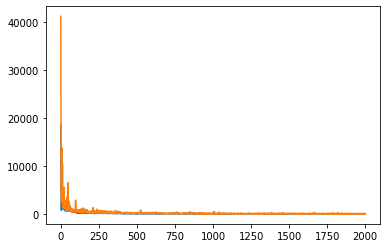

In [16]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [17]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = tcn_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [18]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 20.141658171952145


# Make predictions based on test set and get a root mean squared error 

In [19]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = tcn_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [20]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 28.62955707935266


# Plot train labels along with train predictions

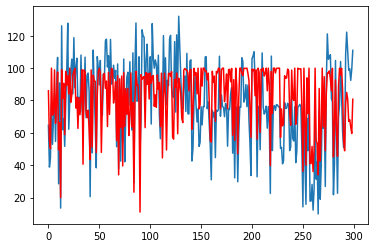

In [21]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

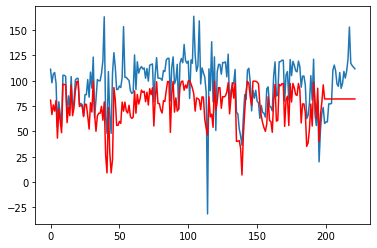

In [22]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with normalization of features

In [23]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [24]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [25]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [26]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [27]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [28]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [29]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [30]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [31]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [32]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [33]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [34]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [35]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Build tcn model

In [36]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Input, Model

from tcn import TCN, tcn_full_summary

batch_size, timesteps, input_dim = None, 21, 6

i = Input(batch_shape=(batch_size, timesteps, input_dim))

o = TCN(return_sequences=False)(i)
o = Dense(1)(o)

tcn_norm = Model(inputs=[i], outputs=[o])
tcn_norm.compile(optimizer='adam', loss='mae')

tcn_full_summary(tcn_norm, expand_residual_blocks=False)

history = tcn_norm.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 21, 6)]           0         
_________________________________________________________________
residual_block_0 (ResidualBl [(None, 21, 64), (None, 2 9536      
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_3 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_4 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_5 (ResidualBl [(None, 21, 64), (None, 2

Epoch 114/2000
10/10 - 0s - loss: 0.1083 - val_loss: 0.1863
Epoch 115/2000
10/10 - 0s - loss: 0.0706 - val_loss: 0.1864
Epoch 116/2000
10/10 - 0s - loss: 0.0751 - val_loss: 0.1829
Epoch 117/2000
10/10 - 0s - loss: 0.0911 - val_loss: 0.1946
Epoch 118/2000
10/10 - 0s - loss: 0.1177 - val_loss: 0.1835
Epoch 119/2000
10/10 - 0s - loss: 0.0836 - val_loss: 0.1920
Epoch 120/2000
10/10 - 0s - loss: 0.0869 - val_loss: 0.1847
Epoch 121/2000
10/10 - 0s - loss: 0.0978 - val_loss: 0.1916
Epoch 122/2000
10/10 - 0s - loss: 0.1027 - val_loss: 0.1791
Epoch 123/2000
10/10 - 0s - loss: 0.0780 - val_loss: 0.1847
Epoch 124/2000
10/10 - 0s - loss: 0.0786 - val_loss: 0.1737
Epoch 125/2000
10/10 - 0s - loss: 0.0862 - val_loss: 0.1945
Epoch 126/2000
10/10 - 0s - loss: 0.0940 - val_loss: 0.1872
Epoch 127/2000
10/10 - 0s - loss: 0.0963 - val_loss: 0.1961
Epoch 128/2000
10/10 - 0s - loss: 0.1098 - val_loss: 0.1858
Epoch 129/2000
10/10 - 0s - loss: 0.0915 - val_loss: 0.1837
Epoch 130/2000
10/10 - 0s - loss: 0.0862

Epoch 251/2000
10/10 - 0s - loss: 0.0719 - val_loss: 0.1688
Epoch 252/2000
10/10 - 0s - loss: 0.0593 - val_loss: 0.1658
Epoch 253/2000
10/10 - 0s - loss: 0.0553 - val_loss: 0.1698
Epoch 254/2000
10/10 - 0s - loss: 0.0735 - val_loss: 0.1773
Epoch 255/2000
10/10 - 0s - loss: 0.0734 - val_loss: 0.1751
Epoch 256/2000
10/10 - 0s - loss: 0.0577 - val_loss: 0.1667
Epoch 257/2000
10/10 - 0s - loss: 0.0522 - val_loss: 0.1677
Epoch 258/2000
10/10 - 0s - loss: 0.0682 - val_loss: 0.1720
Epoch 259/2000
10/10 - 0s - loss: 0.0667 - val_loss: 0.1732
Epoch 260/2000
10/10 - 0s - loss: 0.0728 - val_loss: 0.1650
Epoch 261/2000
10/10 - 0s - loss: 0.0643 - val_loss: 0.1655
Epoch 262/2000
10/10 - 0s - loss: 0.0667 - val_loss: 0.1685
Epoch 263/2000
10/10 - 0s - loss: 0.0600 - val_loss: 0.1709
Epoch 264/2000
10/10 - 0s - loss: 0.0691 - val_loss: 0.1647
Epoch 265/2000
10/10 - 0s - loss: 0.0752 - val_loss: 0.1674
Epoch 266/2000
10/10 - 0s - loss: 0.0661 - val_loss: 0.1698
Epoch 267/2000
10/10 - 0s - loss: 0.0593

Epoch 388/2000
10/10 - 0s - loss: 0.0520 - val_loss: 0.1604
Epoch 389/2000
10/10 - 0s - loss: 0.0489 - val_loss: 0.1586
Epoch 390/2000
10/10 - 0s - loss: 0.0549 - val_loss: 0.1623
Epoch 391/2000
10/10 - 0s - loss: 0.0671 - val_loss: 0.1739
Epoch 392/2000
10/10 - 0s - loss: 0.0626 - val_loss: 0.1629
Epoch 393/2000
10/10 - 0s - loss: 0.0480 - val_loss: 0.1594
Epoch 394/2000
10/10 - 0s - loss: 0.0506 - val_loss: 0.1625
Epoch 395/2000
10/10 - 0s - loss: 0.0550 - val_loss: 0.1681
Epoch 396/2000
10/10 - 0s - loss: 0.0593 - val_loss: 0.1612
Epoch 397/2000
10/10 - 0s - loss: 0.0576 - val_loss: 0.1599
Epoch 398/2000
10/10 - 0s - loss: 0.0600 - val_loss: 0.1605
Epoch 399/2000
10/10 - 0s - loss: 0.0618 - val_loss: 0.1639
Epoch 400/2000
10/10 - 0s - loss: 0.0542 - val_loss: 0.1594
Epoch 401/2000
10/10 - 0s - loss: 0.0489 - val_loss: 0.1566
Epoch 402/2000
10/10 - 0s - loss: 0.0572 - val_loss: 0.1586
Epoch 403/2000
10/10 - 0s - loss: 0.0560 - val_loss: 0.1650
Epoch 404/2000
10/10 - 0s - loss: 0.0532

Epoch 525/2000
10/10 - 0s - loss: 0.0562 - val_loss: 0.1583
Epoch 526/2000
10/10 - 0s - loss: 0.0537 - val_loss: 0.1596
Epoch 527/2000
10/10 - 0s - loss: 0.0536 - val_loss: 0.1609
Epoch 528/2000
10/10 - 0s - loss: 0.0484 - val_loss: 0.1581
Epoch 529/2000
10/10 - 0s - loss: 0.0551 - val_loss: 0.1554
Epoch 530/2000
10/10 - 0s - loss: 0.0593 - val_loss: 0.1624
Epoch 531/2000
10/10 - 0s - loss: 0.0545 - val_loss: 0.1609
Epoch 532/2000
10/10 - 0s - loss: 0.0503 - val_loss: 0.1580
Epoch 533/2000
10/10 - 0s - loss: 0.0562 - val_loss: 0.1611
Epoch 534/2000
10/10 - 0s - loss: 0.0505 - val_loss: 0.1587
Epoch 535/2000
10/10 - 0s - loss: 0.0446 - val_loss: 0.1549
Epoch 536/2000
10/10 - 0s - loss: 0.0418 - val_loss: 0.1571
Epoch 537/2000
10/10 - 0s - loss: 0.0432 - val_loss: 0.1583
Epoch 538/2000
10/10 - 0s - loss: 0.0483 - val_loss: 0.1606
Epoch 539/2000
10/10 - 0s - loss: 0.0557 - val_loss: 0.1570
Epoch 540/2000
10/10 - 0s - loss: 0.0500 - val_loss: 0.1579
Epoch 541/2000
10/10 - 0s - loss: 0.0586

Epoch 662/2000
10/10 - 0s - loss: 0.0493 - val_loss: 0.1598
Epoch 663/2000
10/10 - 0s - loss: 0.0454 - val_loss: 0.1585
Epoch 664/2000
10/10 - 0s - loss: 0.0519 - val_loss: 0.1567
Epoch 665/2000
10/10 - 0s - loss: 0.0551 - val_loss: 0.1583
Epoch 666/2000
10/10 - 0s - loss: 0.0438 - val_loss: 0.1568
Epoch 667/2000
10/10 - 0s - loss: 0.0400 - val_loss: 0.1565
Epoch 668/2000
10/10 - 0s - loss: 0.0437 - val_loss: 0.1546
Epoch 669/2000
10/10 - 0s - loss: 0.0470 - val_loss: 0.1620
Epoch 670/2000
10/10 - 0s - loss: 0.0490 - val_loss: 0.1604
Epoch 671/2000
10/10 - 0s - loss: 0.0484 - val_loss: 0.1586
Epoch 672/2000
10/10 - 0s - loss: 0.0520 - val_loss: 0.1558
Epoch 673/2000
10/10 - 0s - loss: 0.0499 - val_loss: 0.1565
Epoch 674/2000
10/10 - 0s - loss: 0.0411 - val_loss: 0.1559
Epoch 675/2000
10/10 - 0s - loss: 0.0467 - val_loss: 0.1535
Epoch 676/2000
10/10 - 0s - loss: 0.0508 - val_loss: 0.1549
Epoch 677/2000
10/10 - 0s - loss: 0.0478 - val_loss: 0.1584
Epoch 678/2000
10/10 - 0s - loss: 0.0428

Epoch 799/2000
10/10 - 0s - loss: 0.0392 - val_loss: 0.1552
Epoch 800/2000
10/10 - 0s - loss: 0.0398 - val_loss: 0.1529
Epoch 801/2000
10/10 - 0s - loss: 0.0429 - val_loss: 0.1570
Epoch 802/2000
10/10 - 0s - loss: 0.0473 - val_loss: 0.1543
Epoch 803/2000
10/10 - 0s - loss: 0.0443 - val_loss: 0.1542
Epoch 804/2000
10/10 - 0s - loss: 0.0458 - val_loss: 0.1516
Epoch 805/2000
10/10 - 0s - loss: 0.0431 - val_loss: 0.1555
Epoch 806/2000
10/10 - 0s - loss: 0.0408 - val_loss: 0.1554
Epoch 807/2000
10/10 - 0s - loss: 0.0441 - val_loss: 0.1519
Epoch 808/2000
10/10 - 0s - loss: 0.0482 - val_loss: 0.1516
Epoch 809/2000
10/10 - 0s - loss: 0.0425 - val_loss: 0.1580
Epoch 810/2000
10/10 - 0s - loss: 0.0460 - val_loss: 0.1542
Epoch 811/2000
10/10 - 0s - loss: 0.0448 - val_loss: 0.1524
Epoch 812/2000
10/10 - 0s - loss: 0.0475 - val_loss: 0.1588
Epoch 813/2000
10/10 - 0s - loss: 0.0449 - val_loss: 0.1549
Epoch 814/2000
10/10 - 0s - loss: 0.0420 - val_loss: 0.1551
Epoch 815/2000
10/10 - 0s - loss: 0.0467

Epoch 936/2000
10/10 - 0s - loss: 0.0456 - val_loss: 0.1537
Epoch 937/2000
10/10 - 0s - loss: 0.0402 - val_loss: 0.1533
Epoch 938/2000
10/10 - 0s - loss: 0.0408 - val_loss: 0.1511
Epoch 939/2000
10/10 - 0s - loss: 0.0524 - val_loss: 0.1524
Epoch 940/2000
10/10 - 0s - loss: 0.0409 - val_loss: 0.1534
Epoch 941/2000
10/10 - 0s - loss: 0.0364 - val_loss: 0.1508
Epoch 942/2000
10/10 - 0s - loss: 0.0410 - val_loss: 0.1509
Epoch 943/2000
10/10 - 0s - loss: 0.0438 - val_loss: 0.1532
Epoch 944/2000
10/10 - 0s - loss: 0.0389 - val_loss: 0.1517
Epoch 945/2000
10/10 - 0s - loss: 0.0389 - val_loss: 0.1496
Epoch 946/2000
10/10 - 0s - loss: 0.0448 - val_loss: 0.1516
Epoch 947/2000
10/10 - 0s - loss: 0.0446 - val_loss: 0.1534
Epoch 948/2000
10/10 - 0s - loss: 0.0371 - val_loss: 0.1517
Epoch 949/2000
10/10 - 0s - loss: 0.0355 - val_loss: 0.1510
Epoch 950/2000
10/10 - 0s - loss: 0.0423 - val_loss: 0.1516
Epoch 951/2000
10/10 - 0s - loss: 0.0452 - val_loss: 0.1529
Epoch 952/2000
10/10 - 0s - loss: 0.0432

Epoch 1072/2000
10/10 - 0s - loss: 0.0393 - val_loss: 0.1566
Epoch 1073/2000
10/10 - 0s - loss: 0.0387 - val_loss: 0.1534
Epoch 1074/2000
10/10 - 0s - loss: 0.0375 - val_loss: 0.1514
Epoch 1075/2000
10/10 - 0s - loss: 0.0398 - val_loss: 0.1514
Epoch 1076/2000
10/10 - 0s - loss: 0.0397 - val_loss: 0.1551
Epoch 1077/2000
10/10 - 0s - loss: 0.0401 - val_loss: 0.1542
Epoch 1078/2000
10/10 - 0s - loss: 0.0404 - val_loss: 0.1527
Epoch 1079/2000
10/10 - 0s - loss: 0.0399 - val_loss: 0.1548
Epoch 1080/2000
10/10 - 0s - loss: 0.0358 - val_loss: 0.1528
Epoch 1081/2000
10/10 - 0s - loss: 0.0351 - val_loss: 0.1510
Epoch 1082/2000
10/10 - 0s - loss: 0.0340 - val_loss: 0.1527
Epoch 1083/2000
10/10 - 0s - loss: 0.0415 - val_loss: 0.1554
Epoch 1084/2000
10/10 - 0s - loss: 0.0397 - val_loss: 0.1543
Epoch 1085/2000
10/10 - 0s - loss: 0.0373 - val_loss: 0.1520
Epoch 1086/2000
10/10 - 0s - loss: 0.0391 - val_loss: 0.1498
Epoch 1087/2000
10/10 - 0s - loss: 0.0425 - val_loss: 0.1548
Epoch 1088/2000
10/10 - 

Epoch 1207/2000
10/10 - 0s - loss: 0.0357 - val_loss: 0.1524
Epoch 1208/2000
10/10 - 0s - loss: 0.0397 - val_loss: 0.1551
Epoch 1209/2000
10/10 - 0s - loss: 0.0397 - val_loss: 0.1555
Epoch 1210/2000
10/10 - 0s - loss: 0.0350 - val_loss: 0.1531
Epoch 1211/2000
10/10 - 0s - loss: 0.0354 - val_loss: 0.1513
Epoch 1212/2000
10/10 - 0s - loss: 0.0412 - val_loss: 0.1514
Epoch 1213/2000
10/10 - 0s - loss: 0.0380 - val_loss: 0.1527
Epoch 1214/2000
10/10 - 0s - loss: 0.0357 - val_loss: 0.1553
Epoch 1215/2000
10/10 - 0s - loss: 0.0350 - val_loss: 0.1547
Epoch 1216/2000
10/10 - 0s - loss: 0.0408 - val_loss: 0.1582
Epoch 1217/2000
10/10 - 0s - loss: 0.0413 - val_loss: 0.1576
Epoch 1218/2000
10/10 - 0s - loss: 0.0376 - val_loss: 0.1544
Epoch 1219/2000
10/10 - 0s - loss: 0.0389 - val_loss: 0.1551
Epoch 1220/2000
10/10 - 0s - loss: 0.0386 - val_loss: 0.1551
Epoch 1221/2000
10/10 - 0s - loss: 0.0368 - val_loss: 0.1540
Epoch 1222/2000
10/10 - 0s - loss: 0.0371 - val_loss: 0.1536
Epoch 1223/2000
10/10 - 

Epoch 1342/2000
10/10 - 0s - loss: 0.0348 - val_loss: 0.1499
Epoch 1343/2000
10/10 - 0s - loss: 0.0361 - val_loss: 0.1515
Epoch 1344/2000
10/10 - 0s - loss: 0.0367 - val_loss: 0.1520
Epoch 1345/2000
10/10 - 0s - loss: 0.0372 - val_loss: 0.1501
Epoch 1346/2000
10/10 - 0s - loss: 0.0401 - val_loss: 0.1501
Epoch 1347/2000
10/10 - 0s - loss: 0.0386 - val_loss: 0.1513
Epoch 1348/2000
10/10 - 0s - loss: 0.0332 - val_loss: 0.1525
Epoch 1349/2000
10/10 - 0s - loss: 0.0366 - val_loss: 0.1510
Epoch 1350/2000
10/10 - 0s - loss: 0.0374 - val_loss: 0.1519
Epoch 1351/2000
10/10 - 0s - loss: 0.0384 - val_loss: 0.1544
Epoch 1352/2000
10/10 - 0s - loss: 0.0372 - val_loss: 0.1515
Epoch 1353/2000
10/10 - 0s - loss: 0.0361 - val_loss: 0.1509
Epoch 1354/2000
10/10 - 0s - loss: 0.0377 - val_loss: 0.1533
Epoch 1355/2000
10/10 - 0s - loss: 0.0365 - val_loss: 0.1549
Epoch 1356/2000
10/10 - 0s - loss: 0.0355 - val_loss: 0.1509
Epoch 1357/2000
10/10 - 0s - loss: 0.0361 - val_loss: 0.1477
Epoch 1358/2000
10/10 - 

Epoch 1477/2000
10/10 - 0s - loss: 0.0351 - val_loss: 0.1507
Epoch 1478/2000
10/10 - 0s - loss: 0.0368 - val_loss: 0.1535
Epoch 1479/2000
10/10 - 0s - loss: 0.0351 - val_loss: 0.1529
Epoch 1480/2000
10/10 - 0s - loss: 0.0362 - val_loss: 0.1521
Epoch 1481/2000
10/10 - 0s - loss: 0.0366 - val_loss: 0.1490
Epoch 1482/2000
10/10 - 0s - loss: 0.0372 - val_loss: 0.1520
Epoch 1483/2000
10/10 - 0s - loss: 0.0323 - val_loss: 0.1513
Epoch 1484/2000
10/10 - 0s - loss: 0.0317 - val_loss: 0.1507
Epoch 1485/2000
10/10 - 0s - loss: 0.0326 - val_loss: 0.1500
Epoch 1486/2000
10/10 - 0s - loss: 0.0373 - val_loss: 0.1494
Epoch 1487/2000
10/10 - 0s - loss: 0.0417 - val_loss: 0.1557
Epoch 1488/2000
10/10 - 0s - loss: 0.0376 - val_loss: 0.1518
Epoch 1489/2000
10/10 - 0s - loss: 0.0315 - val_loss: 0.1502
Epoch 1490/2000
10/10 - 0s - loss: 0.0339 - val_loss: 0.1504
Epoch 1491/2000
10/10 - 0s - loss: 0.0355 - val_loss: 0.1513
Epoch 1492/2000
10/10 - 0s - loss: 0.0374 - val_loss: 0.1500
Epoch 1493/2000
10/10 - 

Epoch 1612/2000
10/10 - 0s - loss: 0.0354 - val_loss: 0.1503
Epoch 1613/2000
10/10 - 0s - loss: 0.0344 - val_loss: 0.1489
Epoch 1614/2000
10/10 - 0s - loss: 0.0362 - val_loss: 0.1503
Epoch 1615/2000
10/10 - 0s - loss: 0.0348 - val_loss: 0.1507
Epoch 1616/2000
10/10 - 0s - loss: 0.0342 - val_loss: 0.1480
Epoch 1617/2000
10/10 - 0s - loss: 0.0339 - val_loss: 0.1471
Epoch 1618/2000
10/10 - 0s - loss: 0.0392 - val_loss: 0.1509
Epoch 1619/2000
10/10 - 0s - loss: 0.0364 - val_loss: 0.1500
Epoch 1620/2000
10/10 - 0s - loss: 0.0335 - val_loss: 0.1478
Epoch 1621/2000
10/10 - 0s - loss: 0.0369 - val_loss: 0.1489
Epoch 1622/2000
10/10 - 0s - loss: 0.0382 - val_loss: 0.1517
Epoch 1623/2000
10/10 - 0s - loss: 0.0372 - val_loss: 0.1516
Epoch 1624/2000
10/10 - 0s - loss: 0.0366 - val_loss: 0.1487
Epoch 1625/2000
10/10 - 0s - loss: 0.0392 - val_loss: 0.1518
Epoch 1626/2000
10/10 - 0s - loss: 0.0350 - val_loss: 0.1501
Epoch 1627/2000
10/10 - 0s - loss: 0.0323 - val_loss: 0.1465
Epoch 1628/2000
10/10 - 

Epoch 1747/2000
10/10 - 0s - loss: 0.0349 - val_loss: 0.1466
Epoch 1748/2000
10/10 - 0s - loss: 0.0331 - val_loss: 0.1475
Epoch 1749/2000
10/10 - 0s - loss: 0.0331 - val_loss: 0.1496
Epoch 1750/2000
10/10 - 0s - loss: 0.0338 - val_loss: 0.1478
Epoch 1751/2000
10/10 - 0s - loss: 0.0346 - val_loss: 0.1482
Epoch 1752/2000
10/10 - 0s - loss: 0.0347 - val_loss: 0.1501
Epoch 1753/2000
10/10 - 0s - loss: 0.0342 - val_loss: 0.1496
Epoch 1754/2000
10/10 - 0s - loss: 0.0337 - val_loss: 0.1476
Epoch 1755/2000
10/10 - 0s - loss: 0.0330 - val_loss: 0.1485
Epoch 1756/2000
10/10 - 0s - loss: 0.0344 - val_loss: 0.1508
Epoch 1757/2000
10/10 - 0s - loss: 0.0351 - val_loss: 0.1476
Epoch 1758/2000
10/10 - 0s - loss: 0.0334 - val_loss: 0.1442
Epoch 1759/2000
10/10 - 0s - loss: 0.0340 - val_loss: 0.1460
Epoch 1760/2000
10/10 - 0s - loss: 0.0349 - val_loss: 0.1513
Epoch 1761/2000
10/10 - 0s - loss: 0.0365 - val_loss: 0.1498
Epoch 1762/2000
10/10 - 0s - loss: 0.0342 - val_loss: 0.1452
Epoch 1763/2000
10/10 - 

Epoch 1882/2000
10/10 - 0s - loss: 0.0347 - val_loss: 0.1464
Epoch 1883/2000
10/10 - 0s - loss: 0.0363 - val_loss: 0.1455
Epoch 1884/2000
10/10 - 0s - loss: 0.0345 - val_loss: 0.1486
Epoch 1885/2000
10/10 - 0s - loss: 0.0324 - val_loss: 0.1452
Epoch 1886/2000
10/10 - 0s - loss: 0.0318 - val_loss: 0.1443
Epoch 1887/2000
10/10 - 0s - loss: 0.0338 - val_loss: 0.1467
Epoch 1888/2000
10/10 - 0s - loss: 0.0360 - val_loss: 0.1503
Epoch 1889/2000
10/10 - 0s - loss: 0.0334 - val_loss: 0.1472
Epoch 1890/2000
10/10 - 0s - loss: 0.0306 - val_loss: 0.1459
Epoch 1891/2000
10/10 - 0s - loss: 0.0318 - val_loss: 0.1454
Epoch 1892/2000
10/10 - 0s - loss: 0.0337 - val_loss: 0.1508
Epoch 1893/2000
10/10 - 0s - loss: 0.0340 - val_loss: 0.1495
Epoch 1894/2000
10/10 - 0s - loss: 0.0337 - val_loss: 0.1460
Epoch 1895/2000
10/10 - 0s - loss: 0.0363 - val_loss: 0.1477
Epoch 1896/2000
10/10 - 0s - loss: 0.0343 - val_loss: 0.1485
Epoch 1897/2000
10/10 - 0s - loss: 0.0314 - val_loss: 0.1478
Epoch 1898/2000
10/10 - 

# Plot model loss and validation loss

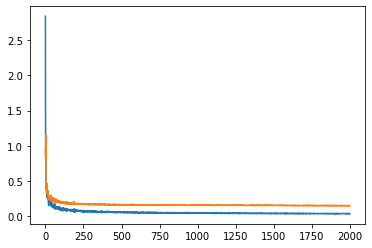

In [37]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [38]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = tcn_norm.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [39]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.07934842452459856


# Make predictions based on test set and get a root mean squared error 

In [40]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = tcn_norm.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [41]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.1995730214661679


# Plot train labels along with train predictions

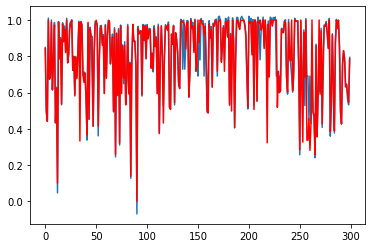

In [42]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

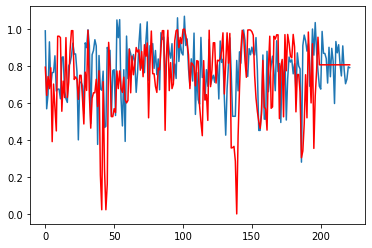

In [43]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with the addition of weather data

In [44]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [45]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [46]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [47]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [48]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [49]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [50]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [51]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [52]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [53]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [54]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [55]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [56]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [57]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Build tcn model

In [58]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Input, Model

from tcn import TCN, tcn_full_summary

batch_size, timesteps, input_dim = None, 21, 9

i = Input(batch_shape=(batch_size, timesteps, input_dim))

o = TCN(return_sequences=False)(i)
o = Dense(1)(o)

tcn_weather = Model(inputs=[i], outputs=[o])
tcn_weather.compile(optimizer='adam', loss='mae')

tcn_full_summary(tcn_weather, expand_residual_blocks=False)

history = tcn_weather.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 21, 9)]           0         
_________________________________________________________________
residual_block_0 (ResidualBl [(None, 21, 64), (None, 2 10112     
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_3 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_4 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_5 (ResidualBl [(None, 21, 64), (None, 2

Epoch 106/2000
10/10 - 0s - loss: 448.6069 - val_loss: 873.4982
Epoch 107/2000
10/10 - 0s - loss: 316.3264 - val_loss: 1138.3494
Epoch 108/2000
10/10 - 0s - loss: 465.4922 - val_loss: 846.8613
Epoch 109/2000
10/10 - 0s - loss: 425.3412 - val_loss: 913.7113
Epoch 110/2000
10/10 - 0s - loss: 398.4248 - val_loss: 663.8502
Epoch 111/2000
10/10 - 0s - loss: 228.0526 - val_loss: 986.2095
Epoch 112/2000
10/10 - 0s - loss: 417.1788 - val_loss: 963.0570
Epoch 113/2000
10/10 - 0s - loss: 449.1139 - val_loss: 899.2906
Epoch 114/2000
10/10 - 0s - loss: 390.6846 - val_loss: 417.4853
Epoch 115/2000
10/10 - 0s - loss: 137.5246 - val_loss: 345.1737
Epoch 116/2000
10/10 - 0s - loss: 116.7728 - val_loss: 502.3848
Epoch 117/2000
10/10 - 0s - loss: 250.8300 - val_loss: 986.7972
Epoch 118/2000
10/10 - 0s - loss: 451.1919 - val_loss: 744.5456
Epoch 119/2000
10/10 - 0s - loss: 258.5969 - val_loss: 634.8199
Epoch 120/2000
10/10 - 0s - loss: 256.4892 - val_loss: 799.8591
Epoch 121/2000
10/10 - 0s - loss: 414.5

10/10 - 0s - loss: 263.4996 - val_loss: 416.0842
Epoch 235/2000
10/10 - 0s - loss: 268.1466 - val_loss: 317.1731
Epoch 236/2000
10/10 - 0s - loss: 260.9836 - val_loss: 339.0635
Epoch 237/2000
10/10 - 0s - loss: 228.7085 - val_loss: 372.0929
Epoch 238/2000
10/10 - 0s - loss: 248.7812 - val_loss: 376.1949
Epoch 239/2000
10/10 - 0s - loss: 230.6735 - val_loss: 407.3681
Epoch 240/2000
10/10 - 0s - loss: 288.0527 - val_loss: 289.8159
Epoch 241/2000
10/10 - 0s - loss: 209.2137 - val_loss: 294.4208
Epoch 242/2000
10/10 - 0s - loss: 123.8727 - val_loss: 376.2741
Epoch 243/2000
10/10 - 0s - loss: 197.4715 - val_loss: 325.8254
Epoch 244/2000
10/10 - 0s - loss: 171.9769 - val_loss: 457.1276
Epoch 245/2000
10/10 - 0s - loss: 247.1560 - val_loss: 313.7535
Epoch 246/2000
10/10 - 0s - loss: 134.8113 - val_loss: 355.5951
Epoch 247/2000
10/10 - 0s - loss: 107.2010 - val_loss: 582.9661
Epoch 248/2000
10/10 - 0s - loss: 233.5276 - val_loss: 561.9859
Epoch 249/2000
10/10 - 0s - loss: 236.5234 - val_loss: 

Epoch 363/2000
10/10 - 0s - loss: 115.1064 - val_loss: 150.3976
Epoch 364/2000
10/10 - 0s - loss: 74.2546 - val_loss: 375.2751
Epoch 365/2000
10/10 - 0s - loss: 167.7165 - val_loss: 340.4094
Epoch 366/2000
10/10 - 0s - loss: 153.4264 - val_loss: 227.8166
Epoch 367/2000
10/10 - 0s - loss: 135.0529 - val_loss: 297.6403
Epoch 368/2000
10/10 - 0s - loss: 126.2976 - val_loss: 205.6957
Epoch 369/2000
10/10 - 0s - loss: 127.1867 - val_loss: 303.7315
Epoch 370/2000
10/10 - 0s - loss: 107.9141 - val_loss: 505.8997
Epoch 371/2000
10/10 - 0s - loss: 198.2070 - val_loss: 201.6236
Epoch 372/2000
10/10 - 0s - loss: 159.0981 - val_loss: 122.5472
Epoch 373/2000
10/10 - 0s - loss: 95.5504 - val_loss: 334.2031
Epoch 374/2000
10/10 - 0s - loss: 150.0185 - val_loss: 238.6581
Epoch 375/2000
10/10 - 0s - loss: 124.7953 - val_loss: 319.9239
Epoch 376/2000
10/10 - 0s - loss: 154.6926 - val_loss: 184.4631
Epoch 377/2000
10/10 - 0s - loss: 112.3140 - val_loss: 347.1531
Epoch 378/2000
10/10 - 0s - loss: 155.9745

Epoch 492/2000
10/10 - 0s - loss: 111.5527 - val_loss: 173.6573
Epoch 493/2000
10/10 - 0s - loss: 108.0424 - val_loss: 169.8163
Epoch 494/2000
10/10 - 0s - loss: 72.5715 - val_loss: 173.7178
Epoch 495/2000
10/10 - 0s - loss: 74.7768 - val_loss: 158.4621
Epoch 496/2000
10/10 - 0s - loss: 117.1004 - val_loss: 152.1094
Epoch 497/2000
10/10 - 0s - loss: 89.6819 - val_loss: 260.8694
Epoch 498/2000
10/10 - 0s - loss: 123.0606 - val_loss: 160.9241
Epoch 499/2000
10/10 - 0s - loss: 80.2356 - val_loss: 224.7811
Epoch 500/2000
10/10 - 0s - loss: 117.5439 - val_loss: 350.5928
Epoch 501/2000
10/10 - 0s - loss: 143.8999 - val_loss: 90.8063
Epoch 502/2000
10/10 - 0s - loss: 34.7092 - val_loss: 279.6047
Epoch 503/2000
10/10 - 0s - loss: 101.4692 - val_loss: 82.1703
Epoch 504/2000
10/10 - 0s - loss: 44.2562 - val_loss: 211.2673
Epoch 505/2000
10/10 - 0s - loss: 90.6316 - val_loss: 233.2199
Epoch 506/2000
10/10 - 0s - loss: 88.0772 - val_loss: 112.3645
Epoch 507/2000
10/10 - 0s - loss: 87.5130 - val_lo

Epoch 622/2000
10/10 - 0s - loss: 79.8129 - val_loss: 175.8720
Epoch 623/2000
10/10 - 0s - loss: 84.0382 - val_loss: 130.4197
Epoch 624/2000
10/10 - 0s - loss: 83.6535 - val_loss: 134.4989
Epoch 625/2000
10/10 - 0s - loss: 75.6612 - val_loss: 142.8720
Epoch 626/2000
10/10 - 0s - loss: 82.3374 - val_loss: 141.7589
Epoch 627/2000
10/10 - 0s - loss: 76.3023 - val_loss: 149.6966
Epoch 628/2000
10/10 - 0s - loss: 80.2801 - val_loss: 165.7680
Epoch 629/2000
10/10 - 0s - loss: 81.1242 - val_loss: 142.7765
Epoch 630/2000
10/10 - 0s - loss: 83.0386 - val_loss: 131.7340
Epoch 631/2000
10/10 - 0s - loss: 78.7329 - val_loss: 149.8199
Epoch 632/2000
10/10 - 0s - loss: 82.9069 - val_loss: 104.8229
Epoch 633/2000
10/10 - 0s - loss: 72.6317 - val_loss: 156.1718
Epoch 634/2000
10/10 - 0s - loss: 81.4555 - val_loss: 113.3771
Epoch 635/2000
10/10 - 0s - loss: 70.7499 - val_loss: 180.8191
Epoch 636/2000
10/10 - 0s - loss: 82.2478 - val_loss: 140.6979
Epoch 637/2000
10/10 - 0s - loss: 75.3893 - val_loss: 1

Epoch 753/2000
10/10 - 0s - loss: 62.9784 - val_loss: 174.4819
Epoch 754/2000
10/10 - 0s - loss: 91.3902 - val_loss: 54.1291
Epoch 755/2000
10/10 - 0s - loss: 70.8690 - val_loss: 175.4965
Epoch 756/2000
10/10 - 0s - loss: 91.8683 - val_loss: 57.7857
Epoch 757/2000
10/10 - 0s - loss: 72.9112 - val_loss: 167.4593
Epoch 758/2000
10/10 - 0s - loss: 93.5387 - val_loss: 58.9976
Epoch 759/2000
10/10 - 0s - loss: 68.7874 - val_loss: 166.8096
Epoch 760/2000
10/10 - 0s - loss: 89.2625 - val_loss: 63.5847
Epoch 761/2000
10/10 - 0s - loss: 69.1438 - val_loss: 131.4923
Epoch 762/2000
10/10 - 0s - loss: 61.4527 - val_loss: 54.2667
Epoch 763/2000
10/10 - 0s - loss: 42.9566 - val_loss: 60.5715
Epoch 764/2000
10/10 - 0s - loss: 47.6263 - val_loss: 72.1077
Epoch 765/2000
10/10 - 0s - loss: 37.2819 - val_loss: 152.6676
Epoch 766/2000
10/10 - 0s - loss: 32.1419 - val_loss: 52.2626
Epoch 767/2000
10/10 - 0s - loss: 41.8975 - val_loss: 167.7567
Epoch 768/2000
10/10 - 0s - loss: 77.9679 - val_loss: 37.7661
E

10/10 - 0s - loss: 33.8827 - val_loss: 137.6793
Epoch 885/2000
10/10 - 0s - loss: 54.7686 - val_loss: 128.7191
Epoch 886/2000
10/10 - 0s - loss: 49.4995 - val_loss: 103.7575
Epoch 887/2000
10/10 - 0s - loss: 48.0971 - val_loss: 81.0678
Epoch 888/2000
10/10 - 0s - loss: 71.2086 - val_loss: 110.5528
Epoch 889/2000
10/10 - 0s - loss: 70.6626 - val_loss: 106.7019
Epoch 890/2000
10/10 - 0s - loss: 70.8198 - val_loss: 113.2257
Epoch 891/2000
10/10 - 0s - loss: 36.5257 - val_loss: 176.4678
Epoch 892/2000
10/10 - 0s - loss: 78.1835 - val_loss: 107.2452
Epoch 893/2000
10/10 - 0s - loss: 48.8784 - val_loss: 77.7057
Epoch 894/2000
10/10 - 0s - loss: 30.9853 - val_loss: 78.7142
Epoch 895/2000
10/10 - 0s - loss: 33.7204 - val_loss: 69.9492
Epoch 896/2000
10/10 - 0s - loss: 51.3674 - val_loss: 49.1661
Epoch 897/2000
10/10 - 0s - loss: 44.1275 - val_loss: 51.2168
Epoch 898/2000
10/10 - 0s - loss: 42.3378 - val_loss: 51.1930
Epoch 899/2000
10/10 - 0s - loss: 45.8940 - val_loss: 157.7938
Epoch 900/2000

Epoch 1016/2000
10/10 - 0s - loss: 51.5545 - val_loss: 110.6110
Epoch 1017/2000
10/10 - 0s - loss: 53.9840 - val_loss: 61.2271
Epoch 1018/2000
10/10 - 0s - loss: 51.1291 - val_loss: 117.6327
Epoch 1019/2000
10/10 - 0s - loss: 55.7864 - val_loss: 56.0024
Epoch 1020/2000
10/10 - 0s - loss: 50.0912 - val_loss: 112.0572
Epoch 1021/2000
10/10 - 0s - loss: 53.1241 - val_loss: 59.2154
Epoch 1022/2000
10/10 - 0s - loss: 49.6376 - val_loss: 127.5754
Epoch 1023/2000
10/10 - 0s - loss: 57.0309 - val_loss: 57.7914
Epoch 1024/2000
10/10 - 0s - loss: 50.3433 - val_loss: 116.0594
Epoch 1025/2000
10/10 - 0s - loss: 54.5314 - val_loss: 56.4694
Epoch 1026/2000
10/10 - 0s - loss: 49.4041 - val_loss: 112.5525
Epoch 1027/2000
10/10 - 0s - loss: 53.1829 - val_loss: 56.9556
Epoch 1028/2000
10/10 - 0s - loss: 47.7927 - val_loss: 55.4828
Epoch 1029/2000
10/10 - 0s - loss: 19.7342 - val_loss: 87.4177
Epoch 1030/2000
10/10 - 0s - loss: 36.0509 - val_loss: 74.1033
Epoch 1031/2000
10/10 - 0s - loss: 33.1300 - val_

Epoch 1146/2000
10/10 - 0s - loss: 61.2627 - val_loss: 31.7835
Epoch 1147/2000
10/10 - 0s - loss: 47.6078 - val_loss: 30.8946
Epoch 1148/2000
10/10 - 0s - loss: 35.8283 - val_loss: 92.6584
Epoch 1149/2000
10/10 - 0s - loss: 34.5939 - val_loss: 67.0190
Epoch 1150/2000
10/10 - 0s - loss: 28.6549 - val_loss: 74.6418
Epoch 1151/2000
10/10 - 0s - loss: 39.1490 - val_loss: 93.2596
Epoch 1152/2000
10/10 - 0s - loss: 41.1618 - val_loss: 89.9759
Epoch 1153/2000
10/10 - 0s - loss: 29.2521 - val_loss: 43.8703
Epoch 1154/2000
10/10 - 0s - loss: 38.4647 - val_loss: 92.5007
Epoch 1155/2000
10/10 - 0s - loss: 37.5511 - val_loss: 43.0435
Epoch 1156/2000
10/10 - 0s - loss: 27.2756 - val_loss: 127.3104
Epoch 1157/2000
10/10 - 0s - loss: 50.4621 - val_loss: 169.5361
Epoch 1158/2000
10/10 - 0s - loss: 76.4709 - val_loss: 50.4723
Epoch 1159/2000
10/10 - 0s - loss: 46.2775 - val_loss: 36.6316
Epoch 1160/2000
10/10 - 0s - loss: 38.1617 - val_loss: 88.3702
Epoch 1161/2000
10/10 - 0s - loss: 48.4894 - val_loss

Epoch 1276/2000
10/10 - 0s - loss: 42.9306 - val_loss: 83.2365
Epoch 1277/2000
10/10 - 0s - loss: 50.2258 - val_loss: 52.3429
Epoch 1278/2000
10/10 - 0s - loss: 41.4576 - val_loss: 82.6767
Epoch 1279/2000
10/10 - 0s - loss: 50.0563 - val_loss: 60.5065
Epoch 1280/2000
10/10 - 0s - loss: 42.9264 - val_loss: 76.0347
Epoch 1281/2000
10/10 - 0s - loss: 48.7079 - val_loss: 63.2702
Epoch 1282/2000
10/10 - 0s - loss: 43.5163 - val_loss: 69.4821
Epoch 1283/2000
10/10 - 0s - loss: 46.1560 - val_loss: 73.7926
Epoch 1284/2000
10/10 - 0s - loss: 42.9628 - val_loss: 86.1697
Epoch 1285/2000
10/10 - 0s - loss: 48.4239 - val_loss: 68.6836
Epoch 1286/2000
10/10 - 0s - loss: 42.3482 - val_loss: 88.0800
Epoch 1287/2000
10/10 - 0s - loss: 49.2156 - val_loss: 63.1652
Epoch 1288/2000
10/10 - 0s - loss: 43.9322 - val_loss: 75.8939
Epoch 1289/2000
10/10 - 0s - loss: 48.0881 - val_loss: 61.3125
Epoch 1290/2000
10/10 - 0s - loss: 43.0735 - val_loss: 76.3671
Epoch 1291/2000
10/10 - 0s - loss: 48.3607 - val_loss: 

Epoch 1406/2000
10/10 - 0s - loss: 39.9428 - val_loss: 105.0096
Epoch 1407/2000
10/10 - 0s - loss: 52.2985 - val_loss: 23.1983
Epoch 1408/2000
10/10 - 0s - loss: 36.1105 - val_loss: 106.9824
Epoch 1409/2000
10/10 - 0s - loss: 50.0149 - val_loss: 238.9076
Epoch 1410/2000
10/10 - 0s - loss: 85.1306 - val_loss: 52.7808
Epoch 1411/2000
10/10 - 0s - loss: 34.7392 - val_loss: 57.8633
Epoch 1412/2000
10/10 - 0s - loss: 36.2363 - val_loss: 64.5084
Epoch 1413/2000
10/10 - 0s - loss: 40.6053 - val_loss: 22.7545
Epoch 1414/2000
10/10 - 0s - loss: 29.8681 - val_loss: 43.5848
Epoch 1415/2000
10/10 - 0s - loss: 35.1159 - val_loss: 64.3111
Epoch 1416/2000
10/10 - 0s - loss: 43.4877 - val_loss: 114.6579
Epoch 1417/2000
10/10 - 0s - loss: 42.3460 - val_loss: 53.0804
Epoch 1418/2000
10/10 - 0s - loss: 24.1808 - val_loss: 60.4928
Epoch 1419/2000
10/10 - 0s - loss: 41.2565 - val_loss: 93.1046
Epoch 1420/2000
10/10 - 0s - loss: 44.5575 - val_loss: 28.7289
Epoch 1421/2000
10/10 - 0s - loss: 25.1033 - val_lo

Epoch 1536/2000
10/10 - 0s - loss: 47.0158 - val_loss: 28.3315
Epoch 1537/2000
10/10 - 0s - loss: 34.6180 - val_loss: 116.1391
Epoch 1538/2000
10/10 - 0s - loss: 50.8255 - val_loss: 26.4465
Epoch 1539/2000
10/10 - 0s - loss: 32.4021 - val_loss: 37.1936
Epoch 1540/2000
10/10 - 0s - loss: 12.6751 - val_loss: 67.0738
Epoch 1541/2000
10/10 - 0s - loss: 29.8245 - val_loss: 91.1421
Epoch 1542/2000
10/10 - 0s - loss: 45.0188 - val_loss: 87.7646
Epoch 1543/2000
10/10 - 0s - loss: 48.6050 - val_loss: 40.3924
Epoch 1544/2000
10/10 - 0s - loss: 35.4210 - val_loss: 101.9990
Epoch 1545/2000
10/10 - 0s - loss: 49.7796 - val_loss: 31.6755
Epoch 1546/2000
10/10 - 0s - loss: 34.7502 - val_loss: 94.4921
Epoch 1547/2000
10/10 - 0s - loss: 48.4912 - val_loss: 32.7333
Epoch 1548/2000
10/10 - 0s - loss: 34.1194 - val_loss: 87.5280
Epoch 1549/2000
10/10 - 0s - loss: 46.4030 - val_loss: 52.3938
Epoch 1550/2000
10/10 - 0s - loss: 38.9466 - val_loss: 83.5171
Epoch 1551/2000
10/10 - 0s - loss: 45.7637 - val_loss

Epoch 1666/2000
10/10 - 0s - loss: 38.1709 - val_loss: 73.8236
Epoch 1667/2000
10/10 - 0s - loss: 42.0893 - val_loss: 46.3077
Epoch 1668/2000
10/10 - 0s - loss: 38.1555 - val_loss: 64.6628
Epoch 1669/2000
10/10 - 0s - loss: 40.8666 - val_loss: 43.5058
Epoch 1670/2000
10/10 - 0s - loss: 36.7764 - val_loss: 74.4778
Epoch 1671/2000
10/10 - 0s - loss: 42.5034 - val_loss: 44.6701
Epoch 1672/2000
10/10 - 0s - loss: 37.6954 - val_loss: 70.9406
Epoch 1673/2000
10/10 - 0s - loss: 41.1743 - val_loss: 49.0644
Epoch 1674/2000
10/10 - 0s - loss: 38.5238 - val_loss: 62.8147
Epoch 1675/2000
10/10 - 0s - loss: 40.4917 - val_loss: 48.4359
Epoch 1676/2000
10/10 - 0s - loss: 37.6764 - val_loss: 65.7940
Epoch 1677/2000
10/10 - 0s - loss: 40.8595 - val_loss: 50.8053
Epoch 1678/2000
10/10 - 0s - loss: 38.5246 - val_loss: 64.2131
Epoch 1679/2000
10/10 - 0s - loss: 39.7581 - val_loss: 49.2973
Epoch 1680/2000
10/10 - 0s - loss: 37.8982 - val_loss: 68.0670
Epoch 1681/2000
10/10 - 0s - loss: 41.0900 - val_loss: 

Epoch 1796/2000
10/10 - 0s - loss: 34.2015 - val_loss: 82.2182
Epoch 1797/2000
10/10 - 0s - loss: 45.0329 - val_loss: 28.8135
Epoch 1798/2000
10/10 - 0s - loss: 35.3636 - val_loss: 78.8418
Epoch 1799/2000
10/10 - 0s - loss: 42.0448 - val_loss: 37.5130
Epoch 1800/2000
10/10 - 0s - loss: 35.4942 - val_loss: 101.1236
Epoch 1801/2000
10/10 - 0s - loss: 47.7540 - val_loss: 21.7110
Epoch 1802/2000
10/10 - 0s - loss: 31.5950 - val_loss: 100.3235
Epoch 1803/2000
10/10 - 0s - loss: 47.1842 - val_loss: 24.2298
Epoch 1804/2000
10/10 - 0s - loss: 32.8262 - val_loss: 92.1385
Epoch 1805/2000
10/10 - 0s - loss: 45.3465 - val_loss: 28.0108
Epoch 1806/2000
10/10 - 0s - loss: 33.0690 - val_loss: 91.8922
Epoch 1807/2000
10/10 - 0s - loss: 45.7366 - val_loss: 28.2628
Epoch 1808/2000
10/10 - 0s - loss: 33.1380 - val_loss: 92.9254
Epoch 1809/2000
10/10 - 0s - loss: 45.3383 - val_loss: 31.1403
Epoch 1810/2000
10/10 - 0s - loss: 33.8090 - val_loss: 86.9673
Epoch 1811/2000
10/10 - 0s - loss: 44.3394 - val_loss

10/10 - 0s - loss: 32.6301 - val_loss: 50.1641
Epoch 1927/2000
10/10 - 0s - loss: 32.2754 - val_loss: 73.6464
Epoch 1928/2000
10/10 - 0s - loss: 38.8639 - val_loss: 38.7688
Epoch 1929/2000
10/10 - 0s - loss: 32.6812 - val_loss: 64.1555
Epoch 1930/2000
10/10 - 0s - loss: 36.2450 - val_loss: 40.8712
Epoch 1931/2000
10/10 - 0s - loss: 33.0137 - val_loss: 57.2119
Epoch 1932/2000
10/10 - 0s - loss: 34.6082 - val_loss: 48.5251
Epoch 1933/2000
10/10 - 0s - loss: 31.7898 - val_loss: 73.7092
Epoch 1934/2000
10/10 - 0s - loss: 37.1559 - val_loss: 62.8694
Epoch 1935/2000
10/10 - 0s - loss: 38.7260 - val_loss: 45.4397
Epoch 1936/2000
10/10 - 0s - loss: 32.8742 - val_loss: 55.8096
Epoch 1937/2000
10/10 - 0s - loss: 35.7496 - val_loss: 48.5722
Epoch 1938/2000
10/10 - 0s - loss: 34.0294 - val_loss: 60.4748
Epoch 1939/2000
10/10 - 0s - loss: 36.7028 - val_loss: 49.0947
Epoch 1940/2000
10/10 - 0s - loss: 33.7895 - val_loss: 59.6408
Epoch 1941/2000
10/10 - 0s - loss: 36.3147 - val_loss: 46.3191
Epoch 19

# Plot model loss and validation loss

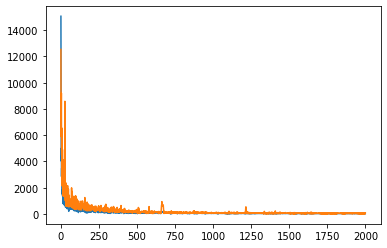

In [59]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [60]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = tcn_weather.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [61]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 40.038401570261314


# Make predictions based on test set and get a root mean squared error 

In [62]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = tcn_weather.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [63]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 102.50853622768872


# Plot train labels along with train predictions

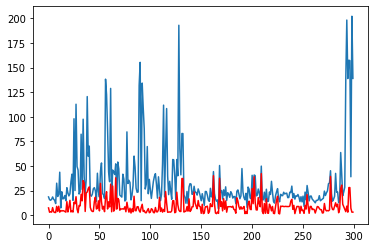

In [64]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

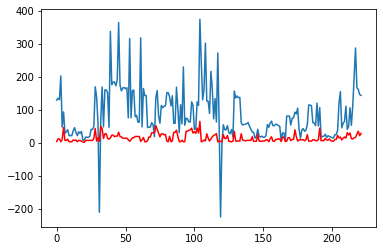

In [65]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of weather data and normalization

In [66]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [67]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [68]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [69]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [70]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [71]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [72]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [73]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [74]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [75]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [76]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [77]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [78]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [79]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [80]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Build tcn model

In [81]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Input, Model

from tcn import TCN, tcn_full_summary

batch_size, timesteps, input_dim = None, 21, 9

i = Input(batch_shape=(batch_size, timesteps, input_dim))

o = TCN(return_sequences=False)(i)
o = Dense(1)(o)

tcn_both = Model(inputs=[i], outputs=[o])
tcn_both.compile(optimizer='adam', loss='mae')

tcn_full_summary(tcn_both, expand_residual_blocks=False)

history = tcn_both.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 21, 9)]           0         
_________________________________________________________________
residual_block_0 (ResidualBl [(None, 21, 64), (None, 2 10112     
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_3 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_4 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_5 (ResidualBl [(None, 21, 64), (None, 2

Epoch 114/2000
10/10 - 0s - loss: 0.0646 - val_loss: 0.1969
Epoch 115/2000
10/10 - 0s - loss: 0.0648 - val_loss: 0.1929
Epoch 116/2000
10/10 - 0s - loss: 0.0685 - val_loss: 0.1967
Epoch 117/2000
10/10 - 0s - loss: 0.0983 - val_loss: 0.1924
Epoch 118/2000
10/10 - 0s - loss: 0.0661 - val_loss: 0.1967
Epoch 119/2000
10/10 - 0s - loss: 0.0559 - val_loss: 0.1975
Epoch 120/2000
10/10 - 0s - loss: 0.0804 - val_loss: 0.1919
Epoch 121/2000
10/10 - 0s - loss: 0.0834 - val_loss: 0.1978
Epoch 122/2000
10/10 - 0s - loss: 0.0744 - val_loss: 0.1971
Epoch 123/2000
10/10 - 0s - loss: 0.0508 - val_loss: 0.2001
Epoch 124/2000
10/10 - 0s - loss: 0.0862 - val_loss: 0.1918
Epoch 125/2000
10/10 - 0s - loss: 0.0949 - val_loss: 0.1930
Epoch 126/2000
10/10 - 0s - loss: 0.0600 - val_loss: 0.1998
Epoch 127/2000
10/10 - 0s - loss: 0.0578 - val_loss: 0.2043
Epoch 128/2000
10/10 - 0s - loss: 0.0820 - val_loss: 0.1930
Epoch 129/2000
10/10 - 0s - loss: 0.0791 - val_loss: 0.1876
Epoch 130/2000
10/10 - 0s - loss: 0.0622

Epoch 251/2000
10/10 - 0s - loss: 0.0459 - val_loss: 0.1810
Epoch 252/2000
10/10 - 0s - loss: 0.0499 - val_loss: 0.1783
Epoch 253/2000
10/10 - 0s - loss: 0.0520 - val_loss: 0.1821
Epoch 254/2000
10/10 - 0s - loss: 0.0516 - val_loss: 0.1778
Epoch 255/2000
10/10 - 0s - loss: 0.0458 - val_loss: 0.1814
Epoch 256/2000
10/10 - 0s - loss: 0.0460 - val_loss: 0.1840
Epoch 257/2000
10/10 - 0s - loss: 0.0436 - val_loss: 0.1810
Epoch 258/2000
10/10 - 0s - loss: 0.0445 - val_loss: 0.1752
Epoch 259/2000
10/10 - 0s - loss: 0.0460 - val_loss: 0.1807
Epoch 260/2000
10/10 - 0s - loss: 0.0585 - val_loss: 0.1786
Epoch 261/2000
10/10 - 0s - loss: 0.0437 - val_loss: 0.1822
Epoch 262/2000
10/10 - 0s - loss: 0.0524 - val_loss: 0.1817
Epoch 263/2000
10/10 - 0s - loss: 0.0468 - val_loss: 0.1798
Epoch 264/2000
10/10 - 0s - loss: 0.0462 - val_loss: 0.1788
Epoch 265/2000
10/10 - 0s - loss: 0.0470 - val_loss: 0.1806
Epoch 266/2000
10/10 - 0s - loss: 0.0505 - val_loss: 0.1733
Epoch 267/2000
10/10 - 0s - loss: 0.0435

Epoch 388/2000
10/10 - 0s - loss: 0.0485 - val_loss: 0.1746
Epoch 389/2000
10/10 - 0s - loss: 0.0329 - val_loss: 0.1771
Epoch 390/2000
10/10 - 0s - loss: 0.0320 - val_loss: 0.1739
Epoch 391/2000
10/10 - 0s - loss: 0.0434 - val_loss: 0.1747
Epoch 392/2000
10/10 - 0s - loss: 0.0468 - val_loss: 0.1753
Epoch 393/2000
10/10 - 0s - loss: 0.0317 - val_loss: 0.1753
Epoch 394/2000
10/10 - 0s - loss: 0.0331 - val_loss: 0.1751
Epoch 395/2000
10/10 - 0s - loss: 0.0441 - val_loss: 0.1757
Epoch 396/2000
10/10 - 0s - loss: 0.0429 - val_loss: 0.1744
Epoch 397/2000
10/10 - 0s - loss: 0.0314 - val_loss: 0.1739
Epoch 398/2000
10/10 - 0s - loss: 0.0364 - val_loss: 0.1725
Epoch 399/2000
10/10 - 0s - loss: 0.0439 - val_loss: 0.1730
Epoch 400/2000
10/10 - 0s - loss: 0.0371 - val_loss: 0.1745
Epoch 401/2000
10/10 - 0s - loss: 0.0339 - val_loss: 0.1716
Epoch 402/2000
10/10 - 0s - loss: 0.0346 - val_loss: 0.1717
Epoch 403/2000
10/10 - 0s - loss: 0.0399 - val_loss: 0.1790
Epoch 404/2000
10/10 - 0s - loss: 0.0433

Epoch 525/2000
10/10 - 0s - loss: 0.0289 - val_loss: 0.1673
Epoch 526/2000
10/10 - 0s - loss: 0.0357 - val_loss: 0.1684
Epoch 527/2000
10/10 - 0s - loss: 0.0334 - val_loss: 0.1704
Epoch 528/2000
10/10 - 0s - loss: 0.0330 - val_loss: 0.1685
Epoch 529/2000
10/10 - 0s - loss: 0.0280 - val_loss: 0.1696
Epoch 530/2000
10/10 - 0s - loss: 0.0344 - val_loss: 0.1669
Epoch 531/2000
10/10 - 0s - loss: 0.0329 - val_loss: 0.1687
Epoch 532/2000
10/10 - 0s - loss: 0.0353 - val_loss: 0.1689
Epoch 533/2000
10/10 - 0s - loss: 0.0302 - val_loss: 0.1653
Epoch 534/2000
10/10 - 0s - loss: 0.0321 - val_loss: 0.1663
Epoch 535/2000
10/10 - 0s - loss: 0.0282 - val_loss: 0.1686
Epoch 536/2000
10/10 - 0s - loss: 0.0326 - val_loss: 0.1693
Epoch 537/2000
10/10 - 0s - loss: 0.0313 - val_loss: 0.1694
Epoch 538/2000
10/10 - 0s - loss: 0.0365 - val_loss: 0.1671
Epoch 539/2000
10/10 - 0s - loss: 0.0343 - val_loss: 0.1707
Epoch 540/2000
10/10 - 0s - loss: 0.0335 - val_loss: 0.1698
Epoch 541/2000
10/10 - 0s - loss: 0.0273

Epoch 662/2000
10/10 - 0s - loss: 0.0334 - val_loss: 0.1611
Epoch 663/2000
10/10 - 0s - loss: 0.0363 - val_loss: 0.1602
Epoch 664/2000
10/10 - 0s - loss: 0.0244 - val_loss: 0.1594
Epoch 665/2000
10/10 - 0s - loss: 0.0230 - val_loss: 0.1596
Epoch 666/2000
10/10 - 0s - loss: 0.0267 - val_loss: 0.1618
Epoch 667/2000
10/10 - 0s - loss: 0.0326 - val_loss: 0.1597
Epoch 668/2000
10/10 - 0s - loss: 0.0306 - val_loss: 0.1611
Epoch 669/2000
10/10 - 0s - loss: 0.0258 - val_loss: 0.1572
Epoch 670/2000
10/10 - 0s - loss: 0.0291 - val_loss: 0.1615
Epoch 671/2000
10/10 - 0s - loss: 0.0356 - val_loss: 0.1595
Epoch 672/2000
10/10 - 0s - loss: 0.0252 - val_loss: 0.1598
Epoch 673/2000
10/10 - 0s - loss: 0.0259 - val_loss: 0.1585
Epoch 674/2000
10/10 - 0s - loss: 0.0317 - val_loss: 0.1610
Epoch 675/2000
10/10 - 0s - loss: 0.0322 - val_loss: 0.1575
Epoch 676/2000
10/10 - 0s - loss: 0.0243 - val_loss: 0.1577
Epoch 677/2000
10/10 - 0s - loss: 0.0274 - val_loss: 0.1566
Epoch 678/2000
10/10 - 0s - loss: 0.0283

Epoch 799/2000
10/10 - 0s - loss: 0.0238 - val_loss: 0.1552
Epoch 800/2000
10/10 - 0s - loss: 0.0290 - val_loss: 0.1530
Epoch 801/2000
10/10 - 0s - loss: 0.0253 - val_loss: 0.1542
Epoch 802/2000
10/10 - 0s - loss: 0.0268 - val_loss: 0.1561
Epoch 803/2000
10/10 - 0s - loss: 0.0247 - val_loss: 0.1525
Epoch 804/2000
10/10 - 0s - loss: 0.0262 - val_loss: 0.1538
Epoch 805/2000
10/10 - 0s - loss: 0.0254 - val_loss: 0.1554
Epoch 806/2000
10/10 - 0s - loss: 0.0246 - val_loss: 0.1571
Epoch 807/2000
10/10 - 0s - loss: 0.0224 - val_loss: 0.1533
Epoch 808/2000
10/10 - 0s - loss: 0.0266 - val_loss: 0.1501
Epoch 809/2000
10/10 - 0s - loss: 0.0262 - val_loss: 0.1568
Epoch 810/2000
10/10 - 0s - loss: 0.0278 - val_loss: 0.1561
Epoch 811/2000
10/10 - 0s - loss: 0.0269 - val_loss: 0.1537
Epoch 812/2000
10/10 - 0s - loss: 0.0258 - val_loss: 0.1559
Epoch 813/2000
10/10 - 0s - loss: 0.0240 - val_loss: 0.1563
Epoch 814/2000
10/10 - 0s - loss: 0.0209 - val_loss: 0.1528
Epoch 815/2000
10/10 - 0s - loss: 0.0240

Epoch 936/2000
10/10 - 0s - loss: 0.0244 - val_loss: 0.1531
Epoch 937/2000
10/10 - 0s - loss: 0.0249 - val_loss: 0.1539
Epoch 938/2000
10/10 - 0s - loss: 0.0225 - val_loss: 0.1544
Epoch 939/2000
10/10 - 0s - loss: 0.0268 - val_loss: 0.1541
Epoch 940/2000
10/10 - 0s - loss: 0.0249 - val_loss: 0.1515
Epoch 941/2000
10/10 - 0s - loss: 0.0229 - val_loss: 0.1534
Epoch 942/2000
10/10 - 0s - loss: 0.0232 - val_loss: 0.1534
Epoch 943/2000
10/10 - 0s - loss: 0.0240 - val_loss: 0.1526
Epoch 944/2000
10/10 - 0s - loss: 0.0237 - val_loss: 0.1527
Epoch 945/2000
10/10 - 0s - loss: 0.0247 - val_loss: 0.1539
Epoch 946/2000
10/10 - 0s - loss: 0.0264 - val_loss: 0.1522
Epoch 947/2000
10/10 - 0s - loss: 0.0225 - val_loss: 0.1514
Epoch 948/2000
10/10 - 0s - loss: 0.0250 - val_loss: 0.1531
Epoch 949/2000
10/10 - 0s - loss: 0.0250 - val_loss: 0.1527
Epoch 950/2000
10/10 - 0s - loss: 0.0231 - val_loss: 0.1519
Epoch 951/2000
10/10 - 0s - loss: 0.0243 - val_loss: 0.1523
Epoch 952/2000
10/10 - 0s - loss: 0.0283

Epoch 1072/2000
10/10 - 0s - loss: 0.0221 - val_loss: 0.1525
Epoch 1073/2000
10/10 - 0s - loss: 0.0232 - val_loss: 0.1539
Epoch 1074/2000
10/10 - 0s - loss: 0.0204 - val_loss: 0.1540
Epoch 1075/2000
10/10 - 0s - loss: 0.0221 - val_loss: 0.1504
Epoch 1076/2000
10/10 - 0s - loss: 0.0226 - val_loss: 0.1504
Epoch 1077/2000
10/10 - 0s - loss: 0.0237 - val_loss: 0.1513
Epoch 1078/2000
10/10 - 0s - loss: 0.0224 - val_loss: 0.1537
Epoch 1079/2000
10/10 - 0s - loss: 0.0233 - val_loss: 0.1512
Epoch 1080/2000
10/10 - 0s - loss: 0.0230 - val_loss: 0.1519
Epoch 1081/2000
10/10 - 0s - loss: 0.0222 - val_loss: 0.1540
Epoch 1082/2000
10/10 - 0s - loss: 0.0197 - val_loss: 0.1517
Epoch 1083/2000
10/10 - 0s - loss: 0.0227 - val_loss: 0.1511
Epoch 1084/2000
10/10 - 0s - loss: 0.0210 - val_loss: 0.1540
Epoch 1085/2000
10/10 - 0s - loss: 0.0225 - val_loss: 0.1514
Epoch 1086/2000
10/10 - 0s - loss: 0.0231 - val_loss: 0.1516
Epoch 1087/2000
10/10 - 0s - loss: 0.0227 - val_loss: 0.1504
Epoch 1088/2000
10/10 - 

Epoch 1207/2000
10/10 - 0s - loss: 0.0202 - val_loss: 0.1496
Epoch 1208/2000
10/10 - 0s - loss: 0.0207 - val_loss: 0.1484
Epoch 1209/2000
10/10 - 0s - loss: 0.0207 - val_loss: 0.1489
Epoch 1210/2000
10/10 - 0s - loss: 0.0225 - val_loss: 0.1517
Epoch 1211/2000
10/10 - 0s - loss: 0.0197 - val_loss: 0.1492
Epoch 1212/2000
10/10 - 0s - loss: 0.0197 - val_loss: 0.1502
Epoch 1213/2000
10/10 - 0s - loss: 0.0182 - val_loss: 0.1484
Epoch 1214/2000
10/10 - 0s - loss: 0.0194 - val_loss: 0.1509
Epoch 1215/2000
10/10 - 0s - loss: 0.0214 - val_loss: 0.1507
Epoch 1216/2000
10/10 - 0s - loss: 0.0231 - val_loss: 0.1502
Epoch 1217/2000
10/10 - 0s - loss: 0.0209 - val_loss: 0.1500
Epoch 1218/2000
10/10 - 0s - loss: 0.0182 - val_loss: 0.1508
Epoch 1219/2000
10/10 - 0s - loss: 0.0203 - val_loss: 0.1494
Epoch 1220/2000
10/10 - 0s - loss: 0.0213 - val_loss: 0.1498
Epoch 1221/2000
10/10 - 0s - loss: 0.0207 - val_loss: 0.1500
Epoch 1222/2000
10/10 - 0s - loss: 0.0205 - val_loss: 0.1512
Epoch 1223/2000
10/10 - 

Epoch 1342/2000
10/10 - 0s - loss: 0.0194 - val_loss: 0.1517
Epoch 1343/2000
10/10 - 0s - loss: 0.0214 - val_loss: 0.1494
Epoch 1344/2000
10/10 - 0s - loss: 0.0210 - val_loss: 0.1505
Epoch 1345/2000
10/10 - 0s - loss: 0.0187 - val_loss: 0.1499
Epoch 1346/2000
10/10 - 0s - loss: 0.0183 - val_loss: 0.1518
Epoch 1347/2000
10/10 - 0s - loss: 0.0193 - val_loss: 0.1512
Epoch 1348/2000
10/10 - 0s - loss: 0.0202 - val_loss: 0.1494
Epoch 1349/2000
10/10 - 0s - loss: 0.0226 - val_loss: 0.1506
Epoch 1350/2000
10/10 - 0s - loss: 0.0200 - val_loss: 0.1527
Epoch 1351/2000
10/10 - 0s - loss: 0.0198 - val_loss: 0.1528
Epoch 1352/2000
10/10 - 0s - loss: 0.0216 - val_loss: 0.1513
Epoch 1353/2000
10/10 - 0s - loss: 0.0194 - val_loss: 0.1508
Epoch 1354/2000
10/10 - 0s - loss: 0.0189 - val_loss: 0.1507
Epoch 1355/2000
10/10 - 0s - loss: 0.0200 - val_loss: 0.1516
Epoch 1356/2000
10/10 - 0s - loss: 0.0191 - val_loss: 0.1508
Epoch 1357/2000
10/10 - 0s - loss: 0.0179 - val_loss: 0.1516
Epoch 1358/2000
10/10 - 

Epoch 1477/2000
10/10 - 0s - loss: 0.0196 - val_loss: 0.1493
Epoch 1478/2000
10/10 - 0s - loss: 0.0197 - val_loss: 0.1524
Epoch 1479/2000
10/10 - 0s - loss: 0.0196 - val_loss: 0.1515
Epoch 1480/2000
10/10 - 0s - loss: 0.0183 - val_loss: 0.1506
Epoch 1481/2000
10/10 - 0s - loss: 0.0191 - val_loss: 0.1504
Epoch 1482/2000
10/10 - 0s - loss: 0.0213 - val_loss: 0.1532
Epoch 1483/2000
10/10 - 0s - loss: 0.0214 - val_loss: 0.1512
Epoch 1484/2000
10/10 - 0s - loss: 0.0174 - val_loss: 0.1499
Epoch 1485/2000
10/10 - 0s - loss: 0.0184 - val_loss: 0.1504
Epoch 1486/2000
10/10 - 0s - loss: 0.0185 - val_loss: 0.1522
Epoch 1487/2000
10/10 - 0s - loss: 0.0208 - val_loss: 0.1508
Epoch 1488/2000
10/10 - 0s - loss: 0.0198 - val_loss: 0.1519
Epoch 1489/2000
10/10 - 0s - loss: 0.0172 - val_loss: 0.1512
Epoch 1490/2000
10/10 - 0s - loss: 0.0164 - val_loss: 0.1531
Epoch 1491/2000
10/10 - 0s - loss: 0.0179 - val_loss: 0.1514
Epoch 1492/2000
10/10 - 0s - loss: 0.0196 - val_loss: 0.1511
Epoch 1493/2000
10/10 - 

Epoch 1612/2000
10/10 - 0s - loss: 0.0193 - val_loss: 0.1499
Epoch 1613/2000
10/10 - 0s - loss: 0.0183 - val_loss: 0.1518
Epoch 1614/2000
10/10 - 0s - loss: 0.0177 - val_loss: 0.1508
Epoch 1615/2000
10/10 - 0s - loss: 0.0196 - val_loss: 0.1510
Epoch 1616/2000
10/10 - 0s - loss: 0.0172 - val_loss: 0.1535
Epoch 1617/2000
10/10 - 0s - loss: 0.0203 - val_loss: 0.1531
Epoch 1618/2000
10/10 - 0s - loss: 0.0194 - val_loss: 0.1525
Epoch 1619/2000
10/10 - 0s - loss: 0.0187 - val_loss: 0.1504
Epoch 1620/2000
10/10 - 0s - loss: 0.0192 - val_loss: 0.1514
Epoch 1621/2000
10/10 - 0s - loss: 0.0210 - val_loss: 0.1516
Epoch 1622/2000
10/10 - 0s - loss: 0.0180 - val_loss: 0.1507
Epoch 1623/2000
10/10 - 0s - loss: 0.0183 - val_loss: 0.1506
Epoch 1624/2000
10/10 - 0s - loss: 0.0183 - val_loss: 0.1507
Epoch 1625/2000
10/10 - 0s - loss: 0.0189 - val_loss: 0.1506
Epoch 1626/2000
10/10 - 0s - loss: 0.0175 - val_loss: 0.1495
Epoch 1627/2000
10/10 - 0s - loss: 0.0188 - val_loss: 0.1494
Epoch 1628/2000
10/10 - 

Epoch 1747/2000
10/10 - 0s - loss: 0.0163 - val_loss: 0.1490
Epoch 1748/2000
10/10 - 0s - loss: 0.0168 - val_loss: 0.1511
Epoch 1749/2000
10/10 - 0s - loss: 0.0194 - val_loss: 0.1479
Epoch 1750/2000
10/10 - 0s - loss: 0.0183 - val_loss: 0.1497
Epoch 1751/2000
10/10 - 0s - loss: 0.0158 - val_loss: 0.1501
Epoch 1752/2000
10/10 - 0s - loss: 0.0160 - val_loss: 0.1510
Epoch 1753/2000
10/10 - 0s - loss: 0.0186 - val_loss: 0.1487
Epoch 1754/2000
10/10 - 0s - loss: 0.0177 - val_loss: 0.1490
Epoch 1755/2000
10/10 - 0s - loss: 0.0182 - val_loss: 0.1514
Epoch 1756/2000
10/10 - 0s - loss: 0.0181 - val_loss: 0.1508
Epoch 1757/2000
10/10 - 0s - loss: 0.0186 - val_loss: 0.1489
Epoch 1758/2000
10/10 - 0s - loss: 0.0181 - val_loss: 0.1491
Epoch 1759/2000
10/10 - 0s - loss: 0.0168 - val_loss: 0.1502
Epoch 1760/2000
10/10 - 0s - loss: 0.0180 - val_loss: 0.1512
Epoch 1761/2000
10/10 - 0s - loss: 0.0176 - val_loss: 0.1502
Epoch 1762/2000
10/10 - 0s - loss: 0.0177 - val_loss: 0.1495
Epoch 1763/2000
10/10 - 

Epoch 1882/2000
10/10 - 0s - loss: 0.0170 - val_loss: 0.1500
Epoch 1883/2000
10/10 - 0s - loss: 0.0184 - val_loss: 0.1479
Epoch 1884/2000
10/10 - 0s - loss: 0.0202 - val_loss: 0.1491
Epoch 1885/2000
10/10 - 0s - loss: 0.0158 - val_loss: 0.1493
Epoch 1886/2000
10/10 - 0s - loss: 0.0159 - val_loss: 0.1485
Epoch 1887/2000
10/10 - 0s - loss: 0.0154 - val_loss: 0.1488
Epoch 1888/2000
10/10 - 0s - loss: 0.0182 - val_loss: 0.1496
Epoch 1889/2000
10/10 - 0s - loss: 0.0181 - val_loss: 0.1499
Epoch 1890/2000
10/10 - 0s - loss: 0.0177 - val_loss: 0.1505
Epoch 1891/2000
10/10 - 0s - loss: 0.0189 - val_loss: 0.1495
Epoch 1892/2000
10/10 - 0s - loss: 0.0174 - val_loss: 0.1492
Epoch 1893/2000
10/10 - 0s - loss: 0.0174 - val_loss: 0.1498
Epoch 1894/2000
10/10 - 0s - loss: 0.0161 - val_loss: 0.1492
Epoch 1895/2000
10/10 - 0s - loss: 0.0170 - val_loss: 0.1499
Epoch 1896/2000
10/10 - 0s - loss: 0.0170 - val_loss: 0.1500
Epoch 1897/2000
10/10 - 0s - loss: 0.0180 - val_loss: 0.1506
Epoch 1898/2000
10/10 - 

# Plot model loss and validation loss

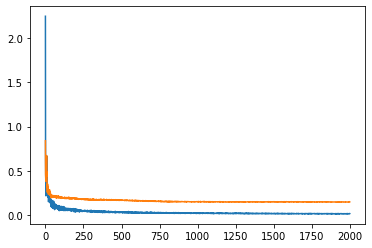

In [82]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [83]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = tcn_both.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [84]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.0532158831890769


# Make predictions based on test set and get a root mean squared error 

In [85]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = tcn_both.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [86]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.209667333002245


# Plot train labels along with train predictions

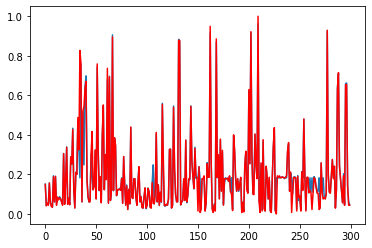

In [87]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

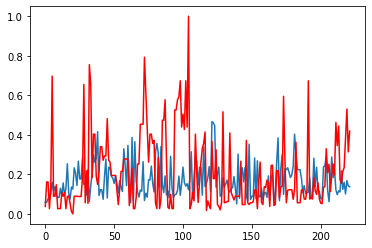

In [88]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

In [90]:
test_yhat[189]

array([0.1032104], dtype=float32)